# Transferencia de estilo neuronal con tf.keras

Basado en el código de TensorFlow que se incluye en los siguientes links.

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/models/blob/master/research/nst_blogpost/4_Neural_Style_Transfer_with_Eager_Execution.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/models/blob/master/research/nst_blogpost/4_Neural_Style_Transfer_with_Eager_Execution.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
</table>

## Descripción general

Usaremos el aprendizaje profundo para componer imágenes en el estilo de otras imágenes. Esto lo conocemos como transferencia de estilo neuronal  y es una técnica descrita en el artículo de Gatys  <b> "El Algoritmo Neuronal de Estilo Artístico"</b> , que es una excelente lectura. 

La transferencia de estilo neuronal es una técnica optimizada que utiliza tres imágenes; la imagen de contenido (normalmente una fotografia), la imagen con el estilo de referencia (una pintura) y la imagen resultado de aplicar el estilo al contenido. 

La imagen final es transformada para parecerse a la imagen contenido, pero “pintada” en el estilo de la imagen de referencia.

### Veremos:

* **Eager Execution** - Usaremos TensorFlow's programming environment que evalua las operaciones de forma inmediata. 
  * [Aprender más](https://www.tensorflow.org/programmers_guide/eager)
  * [Ejemplos](https://www.tensorflow.org/get_started/eager)
* ** Using [Functional API](https://keras.io/getting-started/functional-api-guide/) to define a model** Construiremos un subconjunto de nuestro modelo usando la API funcional
* **Aprovecharemos el uso de un modelo preentrenado** - Aprenderemos cómo utilizar un modelo previamente entrenado y sus características. 
* **Crearemos bucles de entrenamiento** - Examinaremos cómo crear un optimizador y minimizar la pérdida para optimar el modelo

### Seguiremos los siguientes pasos para realizar la transferencia de estilo:

1. Visualizar los datos
2. Proceso básico de perparación de los datos
3. Crear las funciones de pérdida 
4. Crear el modelo
5. Optimizarlo por medi de la función de pérdida

## Configuración

### Descargar imágenes

In [1]:
import os

### Importar y configurar librerías

In [2]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10,10)
mpl.rcParams['axes.grid'] = False

import numpy as np
from PIL import Image
import time
import functools

In [3]:

import tensorflow as tf
from tensorflow.keras.utils import image_dataset_from_directory as kp_image
from tensorflow.python.keras import models 
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K

In [4]:
# Identificar imágenes de contenido y estilo
content_path = 'SG1.jpg'
style_path = 'B.png'

# Visualizar la entrada

In [5]:
from tensorflow.keras.preprocessing.image import img_to_array

def load_img(path_to_img):
    max_dim = 512
    img = Image.open(path_to_img)
    long = max(img.size)
    scale = max_dim / long
    new_size = (round(img.size[0] * scale), round(img.size[1] * scale))
    img = img.resize(new_size, Image.LANCZOS)
  
    img = img_to_array(img)
  
    # We need to broadcast the image array such that it has a batch dimension 
    img = np.expand_dims(img, axis=0)
    return img


In [6]:
def imshow(img, title=None):
  # Eliminar dimensiones de partida
  out = np.squeeze(img, axis=0)
  # Normalizar para mostrar
  out = out.astype('uint8')
  plt.imshow(out)
  if title is not None:
    plt.title(title)
  plt.imshow(out)

Estas son las imágenes de contenido y de estilo. Esperamos "crear" una imagen con el contenido de nuestro imagen de contenido, pero con el estilo de nuestra imagen de estilo.

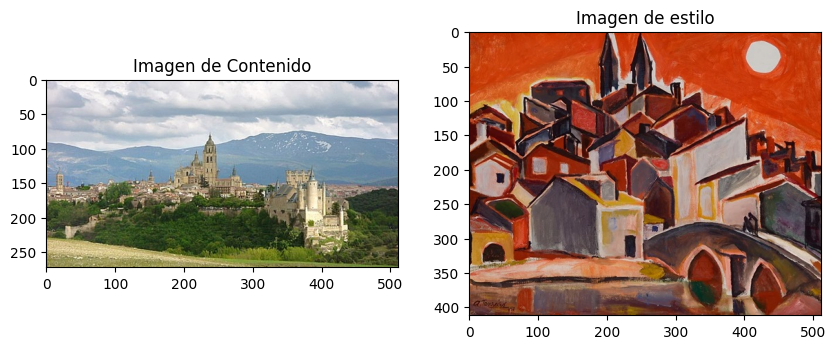

In [7]:
plt.figure(figsize=(10,10))

content = load_img(content_path).astype('uint8')
style = load_img(style_path).astype('uint8')

plt.subplot(1, 2, 1)
imshow(content, 'Imagen de Contenido')

plt.subplot(1, 2, 2)
imshow(style, 'Imagen de estilo')
plt.show()

## Preparar los datos
Vamos a crear los métodos que nos posibilitan cargar y preprocesar nuestras imágenes. Lo realizamos de acuerdo con el procesamiento exigido para el entrenamiento de VGG. Las redes VGG estan entrenadas con imágenes normalizadas por `mean = [103.939, 116.779, 123.68]`y con el canal BGR.

In [8]:
def load_and_process_img(path_to_img):
  img = load_img(path_to_img)
  img = tf.keras.applications.vgg19.preprocess_input(img)
  return img

Para ver las imágenes de salida de nuestra optimización, estamos obligados a llevar a cabo el paso de preprocesamiento inverso . Además, nuestra imagen optimizada necesita que sus valores esten en el rango 0-255.   

In [9]:
def deprocess_img(processed_img):
  x = processed_img.copy()
  if len(x.shape) == 4:
    x = np.squeeze(x, 0)
  assert len(x.shape) == 3, ("La entrada para desprocesar la imagen debe ser una imagen de "
                             "dimensión [1, alto, ancho, canal] o [alto, ancho, canal]")
  if len(x.shape) != 3:
    raise ValueError("Entrada no válida para desprocesar la imagen")
  
  # realizar el paso inverso del preprocesamiento
  x[:, :, 0] += 103.939
  x[:, :, 1] += 116.779
  x[:, :, 2] += 123.68
  x = x[:, :, ::-1]

  x = np.clip(x, 0, 255).astype('uint8')
  return x

### Definir el contenido y el estilo. Representaciones
Para obtener el contenido y el estilo de nuestra imagen, buscaremos en algunas capas intermedias de nuestro modelo. Entrando más profundamente en nuestro modelo, estas capas intermedias representan órdenes mas altos de características. En nuestro caso, estamos usando la red de arquitectura VGG19, una red neuronal preentrenada para la clasificacióm de imágenes. Estas capas intermedias son necesarias para definir el contenido y estilo de nuestras imágenes. Para una imagen de entrada, intentaremos igualar el contenido y el estilo en representaciones de estas capas intermedias. 

#### ¿Porque capas intermedias?

Dentro de nuestra red de clasificación de imágenes previamente entrenada nos permiten definir representaciones de estilo y contenido. En un nivel alto, este fenómeno puede explicarse por el hecho de que para que una red realice la clasificación de imágenes (para lo cual nuestra red ha sido entrenada), debe comprender la imagen. Esto implica tomar la imagen sin procesar como píxeles de entrada y construir una representación interna a través de transformaciones que convierten los píxeles de la imagen sin procesar en una comprensión compleja de las características presentes dentro de la imagen. Esta es también en parte la razón por la que las redes neuronales convolucionales pueden generalizarse bien: son capaces de capturar las invariancias y las características definitorias dentro de clases (por ejemplo, gatos versus perros) que son independientes del ruido de fondo y otras molestias. Por lo tanto, en algún punto entre el momento en que se introduce la imagen sin procesar y se genera la etiqueta de clasificación, el modelo sirve como un extractor de características complejas; por lo tanto, al acceder a capas intermedias, podemos describir el contenido y el estilo de las imágenes de entrada.

Específicamente sacaremos estas capas intermedias de nuestra red:


In [10]:
# Capa de contenido donde extraeremos nuestros mapas de características.
content_layers = ['block5_conv2'] 

# Capa de estilo que nos interesa
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1'
               ]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

## Construyendo el modelo
En este caso cargamos [VGG19](https://keras.io/applications/#vgg19), y alimentamos nuestro tensor de entrada al modelo. Esto nos permitirá extraer los mapas de características (y posteriormente las representaciones de contenido y estilo) del contenido, estilo e imágenes generadas.

Usamos VGG19, como se sugiere en el artículo. Además, dado que VGG19 es un modelo relativamente simple (en comparación con ResNet, Inception, etc.), los mapas de características funcionan mejor para la transferencia de estilo.

Para acceder a las capas intermedias correspondientes a nuestros mapas de características de estilo y contenido, obtenemos las salidas correspondientes y, utilizando la API funcional de Keras, definimos nuestro modelo con las activaciones de salida deseadas.

Con la API funcional, definir un modelo simplemente implica definir la entrada y la salida:

`model = Model(inputs, outputs)`

In [11]:
def get_model():
  """ Crea nuestro modelo con acceso a capas intermedias.
  
  Esta función cargará el modelo VGG19 y accederá a las capas intermedias.
  Estas capas luego se usarán para crear un nuevo modelo que tomará la imagen de entrada.
  y devolver las salidas de estas capas intermedias del modelo VGG.
  
  Devoluciones:
    devuelve un modelo de keras que toma entradas de imágenes y genera el estilo y
      contenido de capas intermedias.
  """
  # Cargamos nuestro modelo. Cargamos VGG previamente entrenado con datos de imagenet.
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  # Obtenga capas de salida correspondientes a capas de estilo y contenido 
  style_outputs = [vgg.get_layer(name).output for name in style_layers]
  content_outputs = [vgg.get_layer(name).output for name in content_layers]
  model_outputs = style_outputs + content_outputs
  # Construimos el modelo 
  return models.Model(vgg.input, model_outputs)

En el código anterior, cargamos nuestra red de clasificación de imágenes previamente entrenada. Luego tomamos las capas de interés como definimos anteriormente. Luego creamos e modelo configurando las entradas del modelo en una imagen y las salidas en las salidas de las capas de estilo y contenido. En otras palabras, creamos un modelo que tomará una imagen de entrada y generará el contenido y diseñará las capas intermedias.


## Definimos y creamos nuestras funciones de pérdida (distancias de contenido y estilo)

### Pérdida de contenido

Nuestra definición de pérdida de contenido es bastante simple. Pasaremos a la red tanto la imagen del contenido deseado como nuestra imagen de entrada base. Esto devolverá las salidas de la capa intermedia (de las capas definidas anteriormente) de nuestro modelo. Luego simplemente tomamos la distancia euclidiana entre las dos representaciones intermedias de esas imágenes.

Más formalmente, la pérdida de contenido es una función que describe la distancia del contenido desde nuestra imagen de salida.
y nuestra imagen de contenido, . Sea una red neuronal convolucional profunda previamente entrenada. De nuevo, en este caso utilizamos [VGG19](https://keras.io/applications/#vgg19). Si $X$ es cualquier imagen, entonces $C_{nn}(X)$ es la red entrenada por . Si $F^l_{ij}(x) \in C_{nn}(x)$ and $P^l_{ij}(p) \in C_{nn}(p)$ describe la respectiva representación de características intermedias de la red con entradas $x$ y $p$ en la capa $l$. Entonces describimos la distancia de contenido (loss) formalmente como: $$L^l_{content}(p, x) = \sum_{i, j} (F^l_{ij}(x) - P^l_{ij}(p))^2$$

Realizamos la retropropagación de la forma habitual para minimizar esta pérdida de contenido. Así cambiamos la imagen inicial hasta que genera una respuesta similar en una determinada capa (definida en content_layer) a la imagen del contenido original.

Esto se puede implementar de manera bastante simple. Nuevamente, tomará como entrada los mapas de características en una capa L en una red alimentada por x, nuestra imagen de entrada, y p, nuestra imagen de contenido, y devolverá la distancia del contenido.


### Pérdida de contenido en código
De hecho, agregaremos nuestras pérdidas de contenido en cada capa deseada. De esta manera, en cada iteración cuando alimentamos nuestra imagen de entrada a través del modelo ( `model(input_image)`), todas las pérdidas de contenido a través del modelo se calcularán correctamente y, debido a que estamos ejecutando este código, todos los gradientes seran computados.

In [12]:
def get_content_loss(base_content, target):
  return tf.reduce_mean(tf.square(base_content - target))

## Pérdida de estilo

La pérdida de estilo es un poco más complicada, pero sigue el mismo principio, esta vez alimentando a nuestra red la imagen de entrada base y la imagen de estilo. Sin embargo, en lugar de comparar las salidas intermedias sin procesar de la imagen de entrada base y la imagen de estilo, comparamos las matrices de Gram de las dos salidas.

Matemáticamente, describimos la pérdida de estilo de la imagen de entrada base, $x$, y la imagen de estilo, $a$,como la distancia entre la representación de estilo (la matriz de Gram) de estas imágenes. Describimos la representación del estilo de una imagen como la correlación entre diferentes respuestas de filtro dadas por la matriz de Gram.  $G^l$, donde $G^l_{ij}$ es el producto interno entre el mapa de características vectorizado $i$ y $j$ en la capa $l$. Vemos que $G^l_{ij}$ generado sobre el mapa de características para una imagen determinada representa la correlación entre mapas de características $i$ y $j$. 

Para generar un estilo para nuestra imagen de entrada base, realizamos un descenso de gradiente desde la imagen del contenido para transformarla en una imagen que coincida con la representación del estilo de la imagen original. Lo hacemos minimizando la distancia media cuadrática entre el mapa de correlación de características de la imagen de estilo y la imagen de entrada. Se describe la contribución de cada capa a la pérdida total de estilo.
$$E_l = \frac{1}{4N_l^2M_l^2} \sum_{i,j}(G^l_{ij} - A^l_{ij})^2$$

donde $G^l_{ij}$ y $A^l_{ij}$ son la representación de estilo respectiva en la capa $l$ de $x$ y $a$. $N_l$ describe el número de mapas de características, cada uno de tamaño. $M_l = height * width$. Por lo tanto, la pérdida total de estilo en cada capa es
$$L_{style}(a, x) = \sum_{l \in L} w_l E_l$$
donde ponderamos la contribución de la pérdida de cada capa por algún factor $w_l$. En nuestro caso, pesamos cada capa por igual. ($w_l =\frac{1}{|L|}$)

### Código Pérdida de estilo
Nuevamente, implementamos nuestra pérdida como una métrica de distancia. 

In [13]:
def gram_matrix(input_tensor):
  # Primero hacemos los canales de imagen. 
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1, channels])
  n = tf.shape(a)[0]
  gram = tf.matmul(a, a, transpose_a=True)
  return gram / tf.cast(n, tf.float32)

def get_style_loss(base_style, gram_target):
  """Esperamos dos imágenes de dimensión h, w, c"""
  # alto, ancho, número de filtros de cada capa
  # Escalamos la pérdida en una capa determinada según el tamaño del mapa de características y la cantidad de filtros
  height, width, channels = base_style.get_shape().as_list()
  gram_style = gram_matrix(base_style)
  
  return tf.reduce_mean(tf.square(gram_style - gram_target))# / (4. * (canales ** 2) * (ancho * alto) ** 2)

## Aplicamos transferencia de estilo a nuestras imágenes.


### Ejecutamos descenso de gradiente 
Si no está familiarizado con el descenso de gradiente/propagación hacia atrás o necesita un repaso, puede consultar este [recurso fantástico](https://developers.google.com/machine-learning/crash-course/retaining-loss/gradient-descent).

En este caso, utilizamos el optimizador [Adam](https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/Adam)* para minimizar nuestra pérdida. Actualizamos iterativamente nuestra imagen de salida de modo que minimice nuestra pérdida: no actualizamos los pesos asociados con nuestra red, sino que entrenamos nuestra imagen de entrada para minimizar la pérdida. Para hacer esto, debemos saber cómo calculamos nuestra pérdida y gradientes.

\* Tenga en cuenta que L-BFGS, que se recomienda si está familiarizado con este algoritmo, no se utiliza en este tutorial porque la motivación principal detrás de este tutorial es ilustrar las mejores prácticas y, al usar Adam, podemos demuestrar la funcionalidad con bucles de entrenamiento personalizados.

Definiremos una pequeña función auxiliar que cargará nuestro contenido y nuestra imagen de estilo, los alimentará a través de nuestra red, que luego generará las representaciones de características de contenido y estilo de nuestro modelo. 

In [14]:
def get_feature_representations(model, content_path, style_path):
  """Función auxiliar para calcular nuestro contenido y representaciones de características de estilo.

  Esta función simplemente cargará y preprocesará tanto el contenido como el estilo.
  imágenes de su camino. Luego los alimentará a través de la red para obtener
  las salidas de las capas intermedias.
  
  Argumentos:
    modelo: El modelo que estamos usando.
    content_path: la ruta a la imagen del contenido.
    style_path: la ruta a la imagen de estilo
    
  Devoluciones:
    devuelve las características de estilo y las características de contenido.
  """
  # Cargue nuestras imágenes en
  content_image = load_and_process_img(content_path)
  style_image = load_and_process_img(style_path)
  
  # características de estilo y contenido de cálculo por lotes
  style_outputs = model(style_image)
  content_outputs = model(content_image)
  
  
  # Obtenga las representaciones de características de estilo y contenido de nuestro modelo. 
  style_features = [style_layer[0] for style_layer in style_outputs[:num_style_layers]]
  content_features = [content_layer[0] for content_layer in content_outputs[num_style_layers:]]
  return style_features, content_features

### Calcular la pérdida y los gradientes.
Usamos [**tf.GradientTape**](https://www.tensorflow.org/programmers_guide/eager#computing_gradients) para calcular el gradiente. Nos permite aprovechar la diferenciación automática disponible mediante operaciones de seguimiento para calcular el gradiente más adelante. Registra las operaciones durante el pase hacia adelante y luego puede calcular el gradiente de nuestra función de pérdida con respecto a nuestra imagen de entrada para el pase hacia atrás.

In [15]:
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
  """Esta función calculará la pérdida total.
  
  Argumentos:
    model: El modelo que nos dará acceso a las capas intermedias
    loss_weights: los pesos de cada contribución de cada función de pérdida.
      (peso de estilo, peso de contenido y peso de variación total)
    init_image: nuestra imagen base inicial. Esta imagen es con la que estamos actualizando.
      nuestro proceso de optimización. Aplicamos los gradientes frente a la pérdida que somos.
      calculando a esta imagen.
    gram_style_features: matrices de gramos precalculadas correspondientes a
      capas de estilo definidas de interés.
    content_features: resultados precalculados de capas de contenido definidas de
      interés.
      
  Devoluciones:
    devuelve la pérdida total, la pérdida de estilo, la pérdida de contenido y la pérdida de variación total
  """
  style_weight, content_weight = loss_weights
  
  # Alimenta nuestra imagen inicial a través de nuestro modelo. Esto nos dará el contenido y
  # representaciones de estilo en nuestras capas.
  # ¡Nuestro modelo es invocable como cualquier otra función!
  model_outputs = model(init_image)
  
  style_output_features = model_outputs[:num_style_layers]
  content_output_features = model_outputs[num_style_layers:]
  
  style_score = 0
  content_score = 0

  # Acumula pérdidas de estilo de todas las capas.
  # Aquí ponderamos por igual cada contribución de cada capa de pérdida.
  weight_per_style_layer = 1.0 / float(num_style_layers)
  for target_style, comb_style in zip(gram_style_features, style_output_features):
    style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)
    
  # Acumula pérdidas de contenido de todas las capas. 
  weight_per_content_layer = 1.0 / float(num_content_layers)
  for target_content, comb_content in zip(content_features, content_output_features):
    content_score += weight_per_content_layer* get_content_loss(comb_content[0], target_content)
  
  style_score *= style_weight
  content_score *= content_weight

  # Obtiene pérdida total
  loss = style_score + content_score 
  return loss, style_score, content_score

Anora calcular el gradiente es facil:

In [16]:
def compute_grads(cfg):
  with tf.GradientTape() as tape: 
    all_loss = compute_loss(**cfg)
  # Calcula gradientes con imagen de entrada
  total_loss = all_loss[0]
  return tape.gradient(total_loss, cfg['init_image']), all_loss

### Bucle de optimización

In [17]:
import IPython.display

def run_style_transfer(content_path, 
                       style_path,
                       num_iterations=300,
                       content_weight=1e3, 
                       style_weight=1e-2): 
  # No necesitamos entrenar ninguna capa de nuestro modelo, por lo que configuramos entreno a falso.
  model = get_model() 
  for layer in model.layers:
    layer.trainable = False
  
  # Obtenemos las representaciones de características de estilo y contenido (de nuestras capas intermedias especificadas)
  style_features, content_features = get_feature_representations(model, content_path, style_path)
  gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
  
  # Establece la imagen inicial
  init_image = load_and_process_img(content_path)
  init_image = tf.Variable(init_image, dtype=tf.float32)
  # Crea nuestro optimizador
  opt = tf.optimizers.Adam(learning_rate=5, epsilon=1e-1)

  # Para mostrar imágenes intermedias 
  iter_count = 1
  
  # Guarda nuestro mejor resultado
  best_loss, best_img = float('inf'), None
  
  # Crea una buena configuración
  loss_weights = (style_weight, content_weight)
  cfg = {
      'model': model,
      'loss_weights': loss_weights,
      'init_image': init_image,
      'gram_style_features': gram_style_features,
      'content_features': content_features
  }
    
  # Para mostrar
  num_rows = 2
  num_cols = 5
  display_interval = num_iterations/(num_rows*num_cols)
  start_time = time.time()
  global_start = time.time()
  
  norm_means = np.array([103.939, 116.779, 123.68])
  min_vals = -norm_means
  max_vals = 255 - norm_means   
  
  imgs = []
  for i in range(num_iterations):
    grads, all_loss = compute_grads(cfg)
    loss, style_score, content_score = all_loss
    opt.apply_gradients([(grads, init_image)])
    clipped = tf.clip_by_value(init_image, min_vals, max_vals)
    init_image.assign(clipped)
    end_time = time.time() 
    
    if loss < best_loss:
      # Actualiza la mejor pérdida y la mejor imagen de la pérdida total. 
      best_loss = loss
      best_img = deprocess_img(init_image.numpy())

    if i % display_interval== 0:
      start_time = time.time()
      
      # Utiliza el método .numpy() para obtener la matriz numpy concreta
      plot_img = init_image.numpy()
      plot_img = deprocess_img(plot_img)
      imgs.append(plot_img)
      IPython.display.clear_output(wait=True)
      IPython.display.display_png(Image.fromarray(plot_img))
      print('Interaciones: {}'.format(i))        
      print('Pérdida total: {:.4e}, ' 
            'pérdida de estilo: {:.4e}, '
            'pérdida de contenido: {:.4e}, '
            'tiempo: {:.4f}s'.format(loss, style_score, content_score, time.time() - start_time))
  print('Tiempo total: {:.4f}s'.format(time.time() - global_start))
  IPython.display.clear_output(wait=True)
  plt.figure(figsize=(14,4))
  for i,img in enumerate(imgs):
      plt.subplot(num_rows,num_cols,i+1)
      plt.imshow(img)
      plt.xticks([])
      plt.yticks([])
      
  return best_img, best_loss 

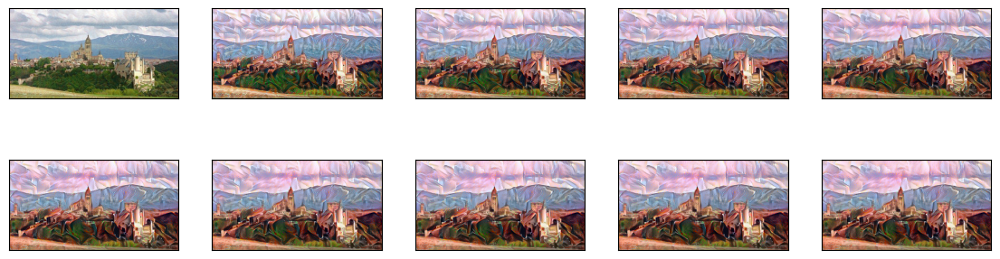

In [18]:
best, best_loss = run_style_transfer(content_path, 
                                     style_path, num_iterations=300)

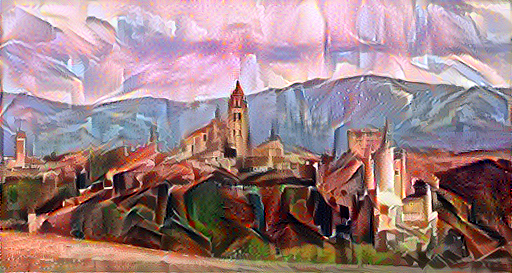

In [19]:
Image.fromarray(best)

Para descargar la imagen de Colab:

In [20]:
final_img = Image.fromarray(best)
final_img.save('Final_Seg_AT.png')

## Visualizar resultados
"Desprocesamos" la imagen de salida para eliminar el procesamiento que se le aplicó. 

In [21]:
def show_results(best_img, content_path, style_path, show_large_final=True):
  plt.figure(figsize=(10, 5))
  content = load_img(content_path) 
  style = load_img(style_path)

  plt.subplot(1, 2, 1)
  imshow(content, 'Imagen de contenido')

  plt.subplot(1, 2, 2)
  imshow(style, 'Imagen de estilo')

  if show_large_final: 
    plt.figure(figsize=(10, 10))

    plt.imshow(best_img)
    plt.title('Imagen final')
    plt.show()

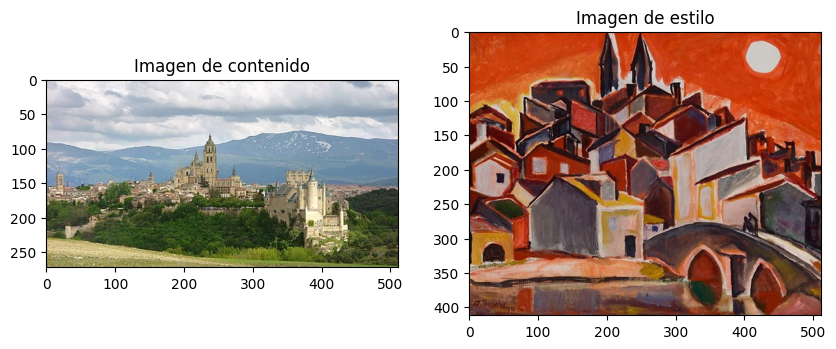

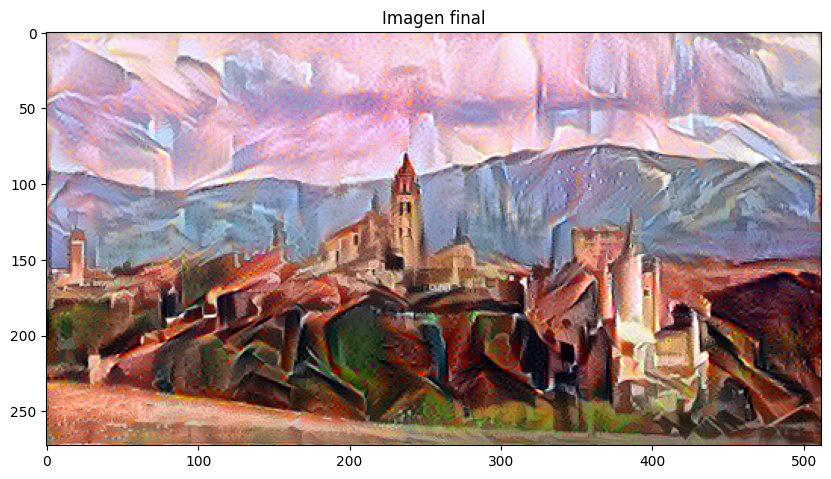

In [22]:
show_results(best, content_path, style_path)

## Prueba con otras pinturas.

### Starry night

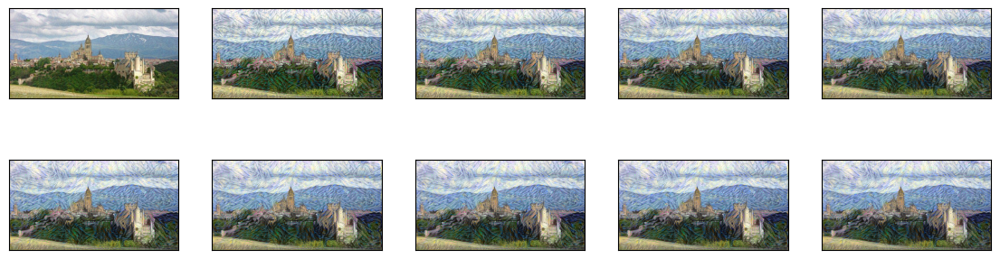

In [23]:
best_starry_night, best_loss = run_style_transfer('SG1.jpg',
                                                  'Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg',num_iterations=300)


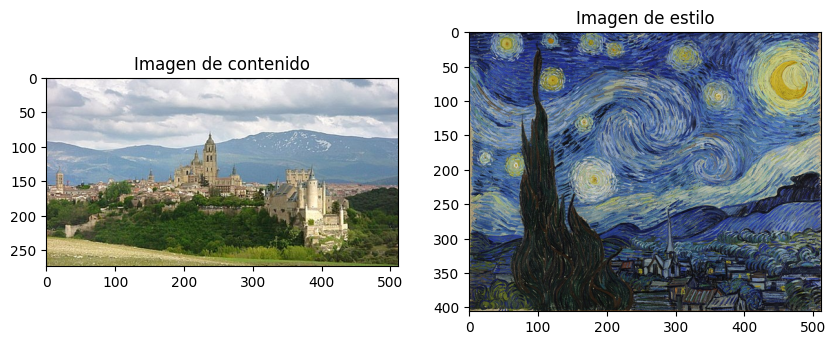

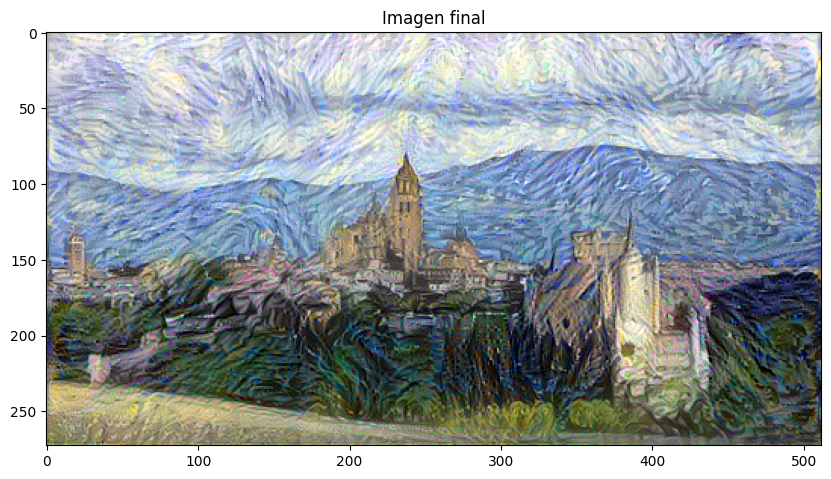

In [24]:
show_results(best_starry_night, 'SG1.jpg',
             'Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg')

In [25]:
final_img = Image.fromarray(best_starry_night)
final_img.save('Best_starry_night.png')

### Pillars of Creation + Segovia

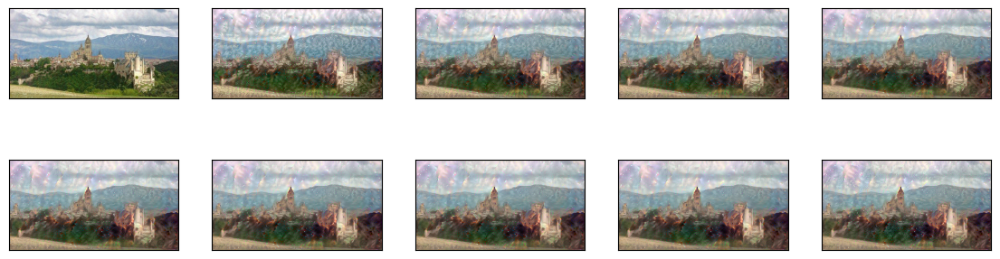

In [26]:
best_poc_segovia, best_loss = run_style_transfer('SG1.jpg', 
                                                  'Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg',num_iterations=300)

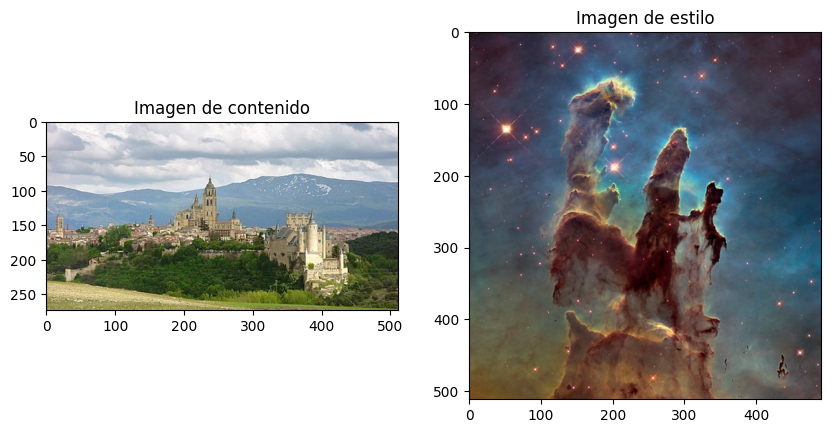

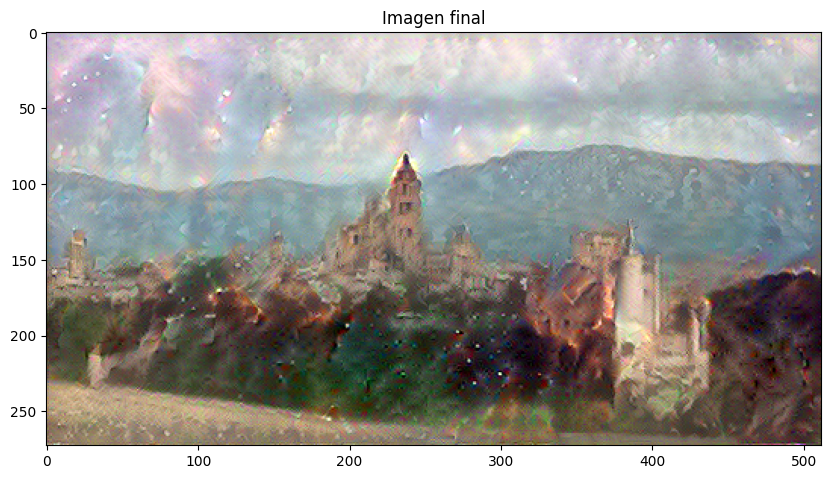

In [27]:
show_results(best_poc_segovia, 
             'SG1.jpg',
             'Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg')

In [28]:
final_img = Image.fromarray(best_poc_segovia)
final_img.save('best_poc_segovia.png')

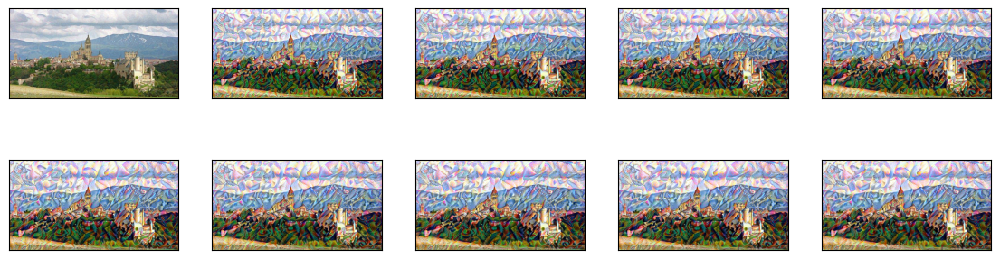

In [29]:
best_kandinsky_segovia, best_loss = run_style_transfer('SG1.jpg', 
                                                  'Vassily_Kandinsky,_1913_-_Composition_7.jpg',num_iterations=300)

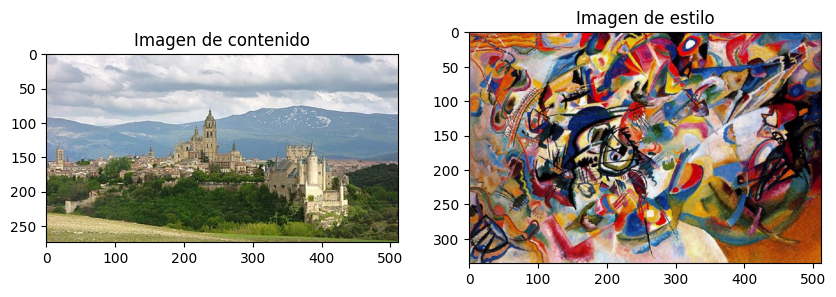

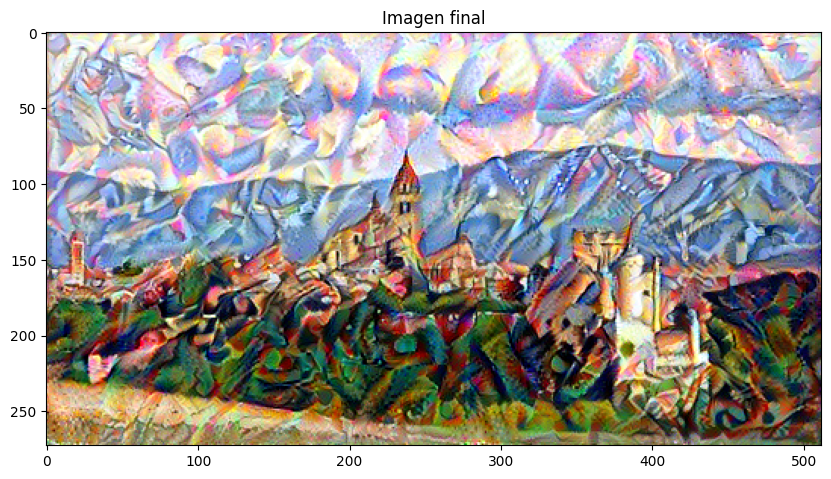

In [30]:
show_results(best_kandinsky_segovia, 
             'SG1.jpg',
             'Vassily_Kandinsky,_1913_-_Composition_7.jpg')

In [31]:
final_img = Image.fromarray(best_kandinsky_segovia)
final_img.save('best_kandinsky_segovia.png')

### RT y Segovia

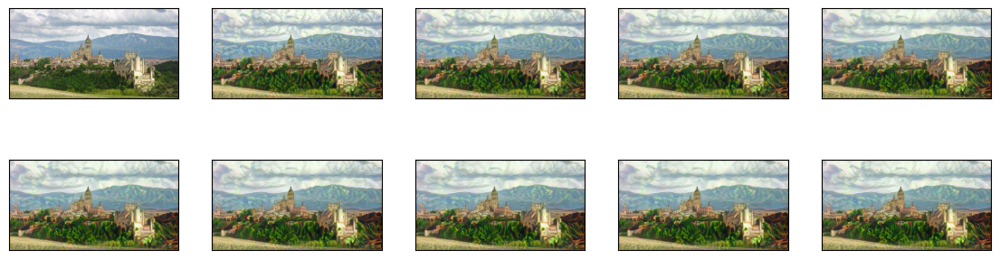

In [32]:
best_RT, best_loss = run_style_transfer('SG1.jpg', 
                                                  'C1.jpg',num_iterations=300)

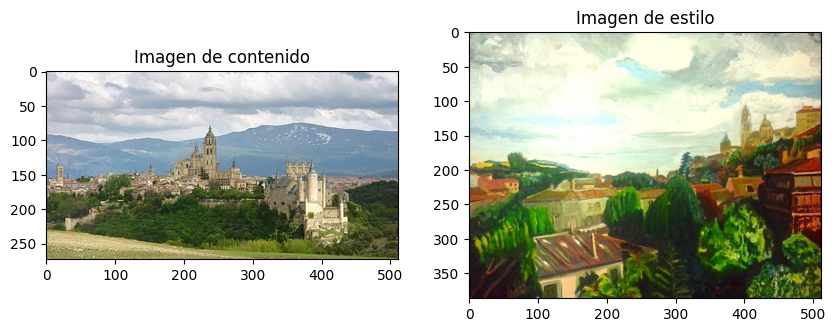

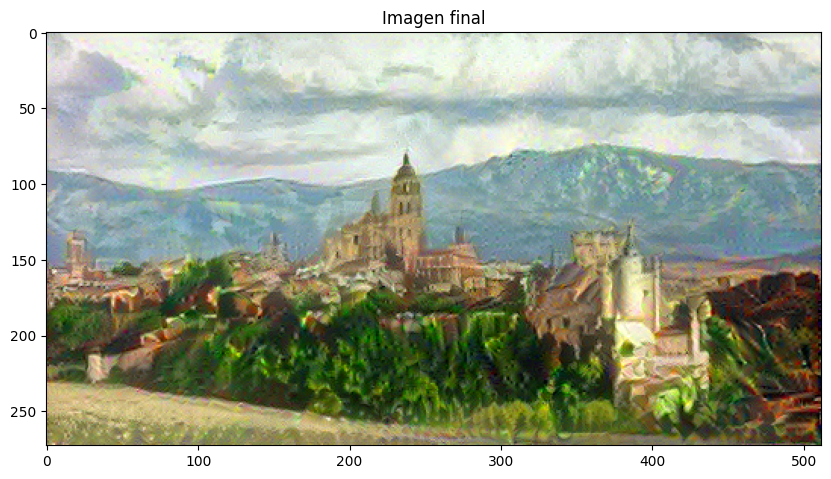

In [33]:
show_results(best_RT, 
             'SG1.jpg',
             'C1.jpg')

In [34]:
final_img = Image.fromarray(best_RT)
final_img.save('best_RT.png')

## Conclusiones clave

### Lo que realizamos:

* Construimos varias funciones de pérdida y utilizamos retropropagación para transformar nuestra imagen de entrada para minimizar estas pérdidas.
  * Para hacer esto, tuvimos que cargar un **modelo previamente entrenado** y usar sus mapas de características aprendidas para describir el contenido y la representación del estilo de nuestras imágenes.
  * Nuestras principales funciones de pérdida fueron calcular la distancia en términos de estas diferentes representaciones.
* Implementamos esto con un modelo personalizado y **ejecución eagger**
  * Construimos nuestro modelo personalizado con la API funcional
  * La ejecución eagger nos permite trabajar dinámicamente con tensores, utilizando un flujo de control natural de Python.
  * Manipulamos los tensores directamente, lo que facilita la depuración y el trabajo con tensores.
* Actualizamos nuestra imagen de forma iterativa aplicando las reglas de actualización de nuestros optimizadores usando **tf.gradient**. El optimizador minimizó una pérdida determinada con respecto a nuestra imagen de entrada.